### Imports

In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

### Unprocessed Data

In [2]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [3]:
train_data

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969
...,...,...,...,...,...,...,...,...,...,...,...,...
550063,1006033,P00372445,M,51-55,13,B,1,1,20,NaN,NaN,368
550064,1006035,P00375436,F,26-35,1,C,3,0,20,NaN,NaN,371
550065,1006036,P00375436,F,26-35,15,B,4+,1,20,NaN,NaN,137
550066,1006038,P00375436,F,55+,1,C,2,0,20,NaN,NaN,365


In [4]:
for col in train_data.columns:
    print(col)
    print(train_data[col].unique())
    print("\n")
# print columns and value they comprised of:    

User_ID
[1000001 1000002 1000003 ... 1004113 1005391 1001529]


Product_ID
['P00069042' 'P00248942' 'P00087842' ... 'P00370293' 'P00371644'
 'P00370853']


Gender
['F' 'M']


Age
['0-17' '55+' '26-35' '46-50' '51-55' '36-45' '18-25']


Occupation
[10 16 15  7 20  9  1 12 17  0  3  4 11  8 19  2 18  5 14 13  6]


City_Category
['A' 'C' 'B']


Stay_In_Current_City_Years
['2' '4+' '3' '1' '0']


Marital_Status
[0 1]


Product_Category_1
[ 3  1 12  8  5  4  2  6 14 11 13 15  7 16 18 10 17  9 20 19]


Product_Category_2
[nan  6. 14.  2.  8. 15. 16. 11.  5.  3.  4. 12.  9. 10. 17. 13.  7. 18.]


Product_Category_3
[nan 14. 17.  5.  4. 16. 15.  8.  9. 13.  6. 12.  3. 18. 11. 10.]


Purchase
[ 8370 15200  1422 ...   135   123   613]




In [5]:
train_data.dtypes

User_ID                         int64
Product_ID                     object
Gender                         object
Age                            object
Occupation                      int64
City_Category                  object
Stay_In_Current_City_Years     object
Marital_Status                  int64
Product_Category_1              int64
Product_Category_2            float64
Product_Category_3            float64
Purchase                        int64
dtype: object

In [6]:
test_data.dtypes

User_ID                         int64
Product_ID                     object
Gender                         object
Age                            object
Occupation                      int64
City_Category                  object
Stay_In_Current_City_Years     object
Marital_Status                  int64
Product_Category_1              int64
Product_Category_2            float64
Product_Category_3            float64
dtype: object

In [7]:
train_data.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Product_Category_3            383247
Purchase                           0
dtype: int64

In [8]:
test_data.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2             72344
Product_Category_3            162562
dtype: int64

In [10]:
submisssion = test_data[['User_ID', "Product_ID"]]

### Visualization

In [11]:
product_based_data = train_data.groupby('Product_ID')

In [12]:
for key,data in product_based_data:
    print(key)
    print("-------------------------------------------------")
    print(data)
    print("\n")

P00000142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
293     1000049  P00000142      M  18-25          12             C   
1066    1000181  P00000142      M  18-25          17             C   
1073    1000182  P00000142      M  18-25           4             C   
1322    1000215  P00000142      M  36-45          14             C   
1910    1000306  P00000142      M  18-25           0             C   
...         ...        ...    ...    ...         ...           ...   
543891  1005746  P00000142      M  18-25          15             B   
544175  1005779  P00000142      M  26-35           5             A   
544671  1005841  P00000142      F  36-45           7             A   
545284  1005949  P00000142      M  18-25          17             B   
545316  1005954  P00000142      M  46-50          11             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
293                       

[749 rows x 12 columns]


P00004042
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
13967   1002073  P00004042      F  18-25           4             B   
24989   1003841  P00004042      M  46-50          18             A   
132734  1002438  P00004042      M  36-45           1             A   
173460  1002854  P00004042      F  18-25           4             B   
186863  1004824  P00004042      M  26-35           7             C   
194992  1000079  P00004042      F  46-50           0             A   
249879  1002507  P00004042      M  26-35           4             A   
271788  1005878  P00004042      F  26-35           0             A   
356609  1000973  P00004042      F  26-35           1             C   
396658  1001087  P00004042      M  26-35          16             B   
462371  1005185  P00004042      F  36-45           4             C   
497328  1004532  P00004042      M  26-35           7             A   
5422

[65 rows x 12 columns]


P00007942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3643    1000590  P00007942      F  36-45           6             C   
12612   1001897  P00007942      F  51-55           2             A   
32279   1004951  P00007942      F  36-45          17             B   
43109   1000655  P00007942      F  26-35           2             B   
45797   1001069  P00007942      M  26-35          20             A   
46996   1001224  P00007942      M  51-55          13             B   
71150   1004928  P00007942      F  26-35           3             A   
90297   1001894  P00007942      F  36-45           7             B   
123949  1001147  P00007942      M  26-35          20             B   
135914  1003004  P00007942      F  18-25           4             A   
154041  1005806  P00007942      F  51-55           1             B   
189738  1005317  P00007942      F  26-35           0             A   
18993

[71 rows x 12 columns]


P00013242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
45397   1001015  P00013242      M  36-45           3             A   
166498  1001699  P00013242      F  26-35          19             A   
240878  1001150  P00013242      F  26-35          20             A   
269664  1005561  P00013242      F  26-35           3             C   
316730  1000850  P00013242      M  36-45           0             A   
354621  1000655  P00013242      F  26-35           2             B   
375650  1003821  P00013242      M  26-35          20             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
45397                          4+               1                   7   
166498                          0               0                   7   
240878                          1               0                   7   
269664                          0               1             

530901                 NaN                 NaN      7122  


P00017442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
4161    1000686  P00017442      M  18-25           4             A   
9319    1001426  P00017442      M  18-25          14             B   
26331   1004033  P00017442      M  26-35           6             B   
31496   1004813  P00017442      F  36-45           9             C   
53849   1002188  P00017442      F  18-25          19             B   
143714  1004140  P00017442      M  26-35           0             B   
171550  1002506  P00017442      F  26-35          14             A   
214766  1003197  P00017442      F  18-25          14             A   
244097  1001613  P00017442      M  18-25          20             A   
249421  1002419  P00017442      M  26-35           0             B   
263699  1004568  P00017442      F  26-35           4             B   
284484  1001794  P00017442      M  26-3

        User_ID Product_ID Gender    Age  Occupation City_Category  \
843     1000151  P00021642      F  26-35          20             A   
6079    1000987  P00021642      F  36-45          17             C   
7509    1001172  P00021642      F  26-35           0             A   
11733   1001758  P00021642      F  26-35           0             B   
13081   1001958  P00021642      F  26-35           1             B   
...         ...        ...    ...    ...         ...           ...   
537452  1004725  P00021642      M  36-45           5             A   
540026  1005131  P00021642      F  26-35           1             B   
541771  1005431  P00021642      M    55+           1             C   
542382  1005520  P00021642      M  46-50           1             C   
542715  1005561  P00021642      F  26-35           3             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
843                             1               1                   8   
6079         

474091                 NaN                 NaN      7830  


P00025942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
2139    1000334  P00025942      F    55+           2             A   
3011    1000486  P00025942      M    55+           0             C   
4601    1000752  P00025942      F  26-35           3             A   
6614    1001068  P00025942      F  18-25           4             B   
7090    1001121  P00025942      M    55+           7             C   
...         ...        ...    ...    ...         ...           ...   
541297  1005355  P00025942      M    55+           0             B   
541459  1005371  P00025942      M  26-35          11             A   
542736  1005567  P00025942      M  51-55           3             B   
543926  1005749  P00025942      M  26-35           2             A   
545185  1005928  P00025942      M  46-50           1             C   

       Stay_In_Current_City_Years  Mar

380923                 NaN                 NaN      6930  


P00030442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3611    1000587  P00030442      M  26-35          20             B   
13311   1001983  P00030442      M  26-35          14             A   
16004   1002454  P00030442      M  18-25           0             B   
28391   1004336  P00030442      F  26-35           0             B   
45560   1001032  P00030442      M  51-55          16             C   
47115   1001244  P00030442      M  26-35           4             A   
53136   1002085  P00030442      M  18-25           0             C   
84183   1001019  P00030442      M  36-45           1             A   
85968   1001266  P00030442      M  26-35           4             B   
93423   1002378  P00030442      M  26-35           3             C   
109928  1004933  P00030442      M  26-35          15             B   
110234  1004979  P00030442      M  36-4

513664                 NaN                 NaN      2021  


P00034642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
10367   1001599  P00034642      M  26-35           0             A   
11796   1001764  P00034642      M  18-25           0             B   
13537   1002015  P00034642      M  18-25           4             B   
22339   1003509  P00034642      M  18-25           4             A   
23395   1003650  P00034642      M  26-35           0             A   
...         ...        ...    ...    ...         ...           ...   
521533  1002242  P00034642      M  18-25           4             A   
524673  1002872  P00034642      M  26-35          20             B   
525533  1002999  P00034642      M  26-35           7             C   
530646  1003735  P00034642      M  26-35           0             B   
536342  1004535  P00034642      M  18-25          19             B   

       Stay_In_Current_City_Years  Mar

[63 rows x 12 columns]


P00038542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
58524   1003032  P00038542      M  26-35           0             A   
100288  1003539  P00038542      F  26-35           4             A   
141342  1003808  P00038542      M  26-35           7             A   
143818  1004161  P00038542      M  46-50           0             B   
204387  1001543  P00038542      M  26-35          11             C   
245372  1001776  P00038542      M  26-35           0             B   
251709  1002857  P00038542      M  26-35           0             B   
261554  1004277  P00038542      M  36-45          16             A   
278005  1000881  P00038542      M  18-25          14             A   
377764  1004098  P00038542      M  36-45           7             C   
440297  1001741  P00038542      M  36-45           7             A   
462349  1005184  P00038542      M  18-25          20             B   
48894

529542                14.0                 NaN      8571  


P00043242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
130     1000026  P00043242      M  26-35           7             B   
16191   1002484  P00043242      M  46-50           5             B   
19759   1003111  P00043242      M  18-25           4             C   
26226   1004021  P00043242      M  51-55          20             B   
35606   1005501  P00043242      M  26-35           2             A   
52200   1001958  P00043242      F  26-35           1             B   
69514   1004635  P00043242      M  18-25           4             B   
71489   1004979  P00043242      M  36-45           2             B   
75204   1005586  P00043242      M  36-45          20             A   
83275   1000877  P00043242      M  26-35           0             B   
87117   1001437  P00043242      M  51-55           3             C   
91589   1002063  P00043242      M  26-3

536801                 NaN                 NaN      7929  


P00047142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
6827    1001094  P00047142      F  18-25           0             C   
24928   1003834  P00047142      M  18-25           2             B   
34790   1005367  P00047142      M  18-25           4             A   
110239  1004983  P00047142      F  46-50          16             A   
128554  1001764  P00047142      M  18-25           0             B   
248920  1002304  P00047142      M  46-50          12             B   
260307  1004064  P00047142      M  46-50           0             A   
269655  1005558  P00047142      M   0-17          10             B   
279298  1001083  P00047142      M    55+           0             B   
287786  1002264  P00047142      F  46-50           7             C   
299141  1004048  P00047142      F  36-45           1             B   
309266  1005658  P00047142      M    55

545180                 NaN                 NaN     10003  


P00051142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
1100    1000187  P00051142      F  46-50           1             B   
8339    1001284  P00051142      M  46-50          16             A   
11994   1001801  P00051142      F  26-35           6             C   
13751   1002048  P00051142      M  51-55           6             B   
14460   1002141  P00051142      F  51-55          16             C   
...         ...        ...    ...    ...         ...           ...   
527826  1003368  P00051142      M  26-35          14             C   
535278  1004404  P00051142      M  26-35           1             B   
537565  1004736  P00051142      M  18-25          20             A   
537996  1004808  P00051142      M  36-45           0             A   
545617  1005997  P00051142      F  26-35           7             A   

       Stay_In_Current_City_Years  Mar

478340                 8.0                 NaN      6878  


P00055642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
264     1000048  P00055642      M  26-35           4             B   
3203    1000524  P00055642      M  18-25           0             A   
11852   1001778  P00055642      M  18-25           4             B   
15057   1002235  P00055642      M   0-17          10             C   
18687   1002934  P00055642      F  36-45          20             B   
33429   1005121  P00055642      M  26-35           7             C   
34411   1005312  P00055642      M  26-35           1             A   
54035   1002222  P00055642      F  46-50           1             B   
59463   1003196  P00055642      F  18-25           4             C   
83637   1000936  P00055642      M  18-25           4             C   
85623   1001220  P00055642      M   0-17          10             A   
91239   1002012  P00055642      M  26-3

517722                 NaN                 NaN      5833  


P00060442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
37542   1005783  P00060442      F  46-50           1             C   
84621   1001088  P00060442      F   0-17          10             A   
309892  1005761  P00060442      M  26-35          20             B   
498924  1004813  P00060442      F  36-45           9             C   
521259  1002199  P00060442      M   0-17          10             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
37542                           3               1                   5   
84621                           3               0                   5   
309892                          1               1                   5   
498924                          3               1                   5   
521259                          3               0                   5   

        Product_Cat

521427                 NaN                 NaN      6101  


P00066142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
44611   1000889  P00066142      M  46-50          20             A   
117462  1000123  P00066142      M  36-45           9             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
44611                           1               0                   8   
117462                         4+               1                   8   

        Product_Category_2  Product_Category_3  Purchase  
44611                 14.0                 NaN      4172  
117462                14.0                 NaN      4092  


P00066242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3915    1000646  P00066242      M  36-45           7             C   
23742   1003690  P00066242      M  18-25           0             B   

539227                 NaN                 NaN      3468  


P00070842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
380366  1004486  P00070842      M  36-45           8             C   
382076  1004771  P00070842      F  26-35           4             A   
511904  1000889  P00070842      M  46-50          20             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
380366                          1               0                   8   
382076                          0               0                   8   
511904                          1               0                   8   

        Product_Category_2  Product_Category_3  Purchase  
380366                 NaN                 NaN      2148  
382076                 NaN                 NaN      4252  
511904                 NaN                 NaN      5955  


P00070942
-------------------------------------------------
       

[233 rows x 12 columns]


P00075842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
7979    1001242  P00075842      F  36-45           0             A   
11729   1001758  P00075842      F  26-35           0             B   
12192   1001836  P00075842      M  26-35           0             A   
18948   1002986  P00075842      M  26-35           4             A   
28001   1004277  P00075842      M  36-45          16             A   
37763   1005812  P00075842      F  26-35           7             A   
43766   1000752  P00075842      F  26-35           3             A   
45414   1001015  P00075842      M  36-45           3             A   
61713   1003518  P00075842      F  18-25           7             A   
95672   1002820  P00075842      F  36-45           0             A   
107000  1004458  P00075842      F  26-35           4             B   
124086  1001164  P00075842      F  26-35          19             A   
1857

[337 rows x 12 columns]


P00081242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
8437    1001297  P00081242      M  26-35           7             A   
66718   1004217  P00081242      M  18-25           4             B   
79898   1000302  P00081242      M  18-25           4             B   
102274  1003793  P00081242      M  18-25           4             C   
142763  1004014  P00081242      M  26-35           0             C   
169541  1002116  P00081242      M  18-25           4             B   
200959  1001054  P00081242      M   0-17          10             C   
258746  1003842  P00081242      F  36-45          16             B   
308764  1005575  P00081242      M  36-45           7             C   
319379  1001220  P00081242      M   0-17          10             A   
388317  1005761  P00081242      M  26-35          20             B   
418034  1004312  P00081242      M  26-35          18             A   
5266


P00085742
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
11304   1001705  P00085742      F  18-25           4             C   
28506   1004345  P00085742      F  26-35          14             B   
32590   1005001  P00085742      F  26-35           2             B   
34788   1005367  P00085742      M  18-25           4             A   
79378   1000212  P00085742      M  26-35          16             C   
166142  1001657  P00085742      F  46-50           0             B   
168082  1001926  P00085742      F   0-17           0             B   
173120  1002793  P00085742      M  36-45           7             B   
173619  1002878  P00085742      F  51-55          20             A   
184544  1004456  P00085742      F  36-45           2             C   
194416  1006016  P00085742      M  46-50           1             B   
207231  1001935  P00085742      M   0-17          10             B   
228359  1005190  P00085742   

364327                13.0                 NaN      8771  


P00089942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
4056    1000670  P00089942      M  26-35          12             B   
5291    1000864  P00089942      F  26-35           0             B   
11568   1001741  P00089942      M  36-45           7             A   
21589   1003410  P00089942      M  36-45           1             B   
23059   1003610  P00089942      M  18-25           6             B   
32941   1005054  P00089942      M  36-45           2             B   
35736   1005517  P00089942      M    55+           0             C   
50728   1001749  P00089942      M  26-35           2             B   
68694   1004497  P00089942      M  51-55           0             B   
68761   1004506  P00089942      M  51-55          16             B   
73386   1005306  P00089942      F  26-35          17             B   
88991   1001699  P00089942      F  26-3

[237 rows x 12 columns]


P00101142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
772     1000146  P00101142      F  36-45          20             B   
2179    1000339  P00101142      M  51-55           7             C   
14862   1002205  P00101142      F  26-35           7             A   
17904   1002820  P00101142      F  36-45           0             A   
18234   1002878  P00101142      F  51-55          20             A   
...         ...        ...    ...    ...         ...           ...   
500125  1005015  P00101142      M  36-45           6             B   
500943  1005139  P00101142      M  51-55          16             A   
509241  1000445  P00101142      M  46-50          12             A   
529593  1003600  P00101142      M  36-45          20             B   
543763  1005722  P00101142      M  26-35          20             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[108 rows x 12 columns]


P00105642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
7017    1001117  P00105642      M  18-25          14             B   
7758    1001203  P00105642      F  26-35           1             A   
10453   1001607  P00105642      M  46-50           1             A   
21994   1003469  P00105642      M  46-50          17             B   
22734   1003562  P00105642      F  26-35           6             B   
...         ...        ...    ...    ...         ...           ...   
519042  1001903  P00105642      M  36-45           0             B   
526441  1003140  P00105642      F  26-35           4             C   
532456  1003988  P00105642      F  26-35          14             B   
538164  1004831  P00105642      F  26-35           1             C   
544828  1005868  P00105642      M  36-45          14             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


        User_ID Product_ID Gender    Age  Occupation City_Category  \
237     1000044  P00110542      M  46-50          17             B   
960     1000166  P00110542      M  18-25           4             B   
1187    1000196  P00110542      F  36-45           9             C   
1825    1000299  P00110542      M  26-35          12             C   
1983    1000319  P00110542      F  51-55           6             B   
...         ...        ...    ...    ...         ...           ...   
542849  1005582  P00110542      M  46-50           1             C   
543644  1005698  P00110542      M  36-45          14             B   
544164  1005777  P00110542      M   0-17           0             C   
544722  1005848  P00110542      M  51-55          20             A   
545487  1005977  P00110542      M  36-45           1             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
237                             3               1                   8   
960          

        User_ID Product_ID Gender    Age  Occupation City_Category  \
794     1000148  P00114542      M  51-55          17             B   
2250    1000349  P00114542      M   0-17          10             C   
4225    1000698  P00114542      M  18-25           4             A   
4500    1000733  P00114542      M  36-45          16             C   
4942    1000802  P00114542      M  26-35          16             B   
...         ...        ...    ...    ...         ...           ...   
541725  1005422  P00114542      M  51-55           7             A   
541895  1005445  P00114542      M  26-35           0             C   
545024  1005893  P00114542      M  26-35           7             A   
545669  1006002  P00114542      M  51-55           0             C   
545894  1006037  P00114542      F  46-50           1             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
794                             3               1                   5   
2250         

[643 rows x 12 columns]


P00118842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
706     1000136  P00118842      M  18-25           2             B   
2218    1000346  P00118842      F  26-35           0             B   
11090   1001680  P00118842      M  26-35          20             A   
15766   1002401  P00118842      M  26-35           4             C   
23003   1003603  P00118842      F  36-45           7             B   
...         ...        ...    ...    ...         ...           ...   
512287  1000963  P00118842      M  26-35           0             A   
526984  1003240  P00118842      M  18-25           4             B   
528977  1003519  P00118842      F  26-35          14             A   
532230  1003950  P00118842      M  26-35           4             C   
538567  1004916  P00118842      M  18-25          20             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


512348                 NaN                 NaN      4621  


P00123342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
11059   1001680  P00123342      M  26-35          20             A   
79598   1000254  P00123342      M  36-45          17             C   
79753   1000278  P00123342      M  46-50          18             C   
131259  1002140  P00123342      M  46-50          14             C   
139313  1003528  P00123342      M  36-45           5             C   
263224  1004497  P00123342      M  51-55           0             B   
311478  1006005  P00123342      F  26-35           5             C   
325404  1002056  P00123342      M  26-35           4             B   
350262  1005954  P00123342      M  46-50          11             A   
412194  1003476  P00123342      M  51-55           0             B   
418238  1004344  P00123342      M  26-35           1             A   
445428  1002590  P00123342      M  18-2

        User_ID Product_ID Gender    Age  Occupation City_Category  \
769     1000146  P00127542      F  36-45          20             B   
1980    1000316  P00127542      M    55+          13             C   
2776    1000445  P00127542      M  46-50          12             A   
3107    1000510  P00127542      M  18-25          12             C   
3959    1000651  P00127542      M  36-45           7             B   
...         ...        ...    ...    ...         ...           ...   
541181  1005337  P00127542      F  36-45           3             C   
541672  1005412  P00127542      M  26-35          12             A   
543307  1005650  P00127542      F  36-45          12             B   
544580  1005831  P00127542      M  26-35           1             A   
545659  1006001  P00127542      F  26-35           7             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
769                             3               1                   1   
1980         

517474                 NaN                 NaN      8120  


P00131942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
368     1000059  P00131942      F  51-55           1             B   
67384   1004318  P00131942      M  26-35           5             B   
114766  1005717  P00131942      M  26-35           0             B   
127408  1001632  P00131942      M  26-35          16             B   
192372  1005722  P00131942      M  26-35          20             A   
195522  1000169  P00131942      M  26-35           7             B   
242136  1001317  P00131942      M  46-50           7             B   
329394  1002778  P00131942      M    55+          13             B   
409154  1003001  P00131942      M  18-25           4             B   
412559  1003519  P00131942      F  26-35          14             A   
466190  1005795  P00131942      M  26-35           1             A   
502813  1005463  P00131942      M  36-4

[287 rows x 12 columns]


P00136642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
13208   1001974  P00136642      M  36-45          17             B   
203998  1001470  P00136642      M  18-25           4             A   
206142  1001773  P00136642      M  18-25           4             B   
218606  1003713  P00136642      F  26-35           7             B   
229169  1005340  P00136642      F  51-55           3             C   
239004  1000889  P00136642      M  46-50          20             A   
248249  1002181  P00136642      M  26-35           0             B   
304131  1004823  P00136642      M  18-25           4             B   
308951  1005606  P00136642      F  26-35          14             C   
358592  1001242  P00136642      F  36-45           0             A   
361218  1001624  P00136642      M  26-35           0             B   
375765  1003829  P00136642      F  26-35           1             B   
3757

523648                14.0                 NaN      3911  


P00141542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
6962    1001112  P00141542      M  18-25           6             A   
8255    1001273  P00141542      M  36-45           2             C   
11307   1001706  P00141542      M  26-35          20             B   
17134   1002679  P00141542      F  18-25           4             A   
18780   1002952  P00141542      M  26-35           4             B   
...         ...        ...    ...    ...         ...           ...   
536943  1004644  P00141542      M  51-55           1             C   
539027  1004995  P00141542      M  51-55          20             B   
539436  1005054  P00141542      M  36-45           2             B   
542197  1005493  P00141542      M  36-45          12             B   
544531  1005825  P00141542      F  26-35           4             B   

       Stay_In_Current_City_Years  Mar

[73 rows x 12 columns]


P00146342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
5203    1000854  P00146342      F  26-35          16             B   
13088   1001958  P00146342      F  26-35           1             B   
14231   1002106  P00146342      F  18-25          20             A   
15847   1002418  P00146342      F   0-17          10             B   
21465   1003391  P00146342      M  18-25           4             A   
...         ...        ...    ...    ...         ...           ...   
531001  1003778  P00146342      M  26-35           0             B   
532121  1003934  P00146342      M  26-35           0             B   
534185  1004250  P00146342      F  51-55           0             C   
536828  1004619  P00146342      F  26-35           1             B   
544441  1005812  P00146342      F  26-35           7             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
5

[552 rows x 12 columns]


P00150442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
4340    1000714  P00150442      M  18-25           4             B   
24665   1003808  P00150442      M  26-35           7             A   
25413   1003912  P00150442      M  26-35           4             A   
34218   1005277  P00150442      M  26-35          20             B   
44094   1000808  P00150442      M  26-35           7             B   
64828   1003942  P00150442      M  18-25           4             B   
69489   1004630  P00150442      F  26-35           4             C   
78273   1000026  P00150442      M  26-35           7             B   
87394   1001470  P00150442      M  18-25           4             A   
122183  1000889  P00150442      M  46-50          20             A   
123386  1001086  P00150442      M  18-25           4             A   
125854  1001409  P00150442      M  18-25           4             B   
1293

        User_ID Product_ID Gender    Age  Occupation City_Category  \
2198    1000343  P00155242      F  36-45           3             B   
4054    1000669  P00155242      M  26-35          17             B   
8562    1001314  P00155242      F  18-25           4             C   
11096   1001680  P00155242      M  26-35          20             A   
14059   1002091  P00155242      F  36-45          20             C   
...         ...        ...    ...    ...         ...           ...   
532893  1004041  P00155242      M  18-25           3             B   
536777  1004609  P00155242      F  26-35           4             B   
539071  1005001  P00155242      F  26-35           2             B   
539424  1005054  P00155242      M  36-45           2             B   
544519  1005824  P00155242      M  18-25          12             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
2198                            2               0                   3   
4054         

532460                 NaN                 NaN      8050  


P00160442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
7317    1001147  P00160442      M  26-35          20             B   
18025   1002841  P00160442      M  51-55          12             B   
71031   1004903  P00160442      M  36-45          12             C   
114259  1005636  P00160442      M  26-35           7             A   
174362  1002986  P00160442      M  26-35           4             A   
190135  1005369  P00160442      M  26-35          15             A   
201065  1001069  P00160442      M  26-35          20             A   
202379  1001242  P00160442      F  36-45           0             A   
213365  1002967  P00160442      M  26-35           0             A   
235055  1000238  P00160442      F  51-55           7             B   
264354  1004682  P00160442      M  26-35           7             B   
279956  1001164  P00160442      F  26-3

        User_ID Product_ID Gender    Age  Occupation City_Category  \
4204    1000692  P00165642      F  26-35           0             A   
5413    1000881  P00165642      M  18-25          14             A   
6821    1001091  P00165642      M  18-25           5             C   
27620   1004227  P00165642      M  26-35          19             A   
40483   1000223  P00165642      M  26-35          17             B   
...         ...        ...    ...    ...         ...           ...   
527165  1003272  P00165642      M  36-45           0             B   
529728  1003618  P00165642      M    55+          17             A   
536983  1004647  P00165642      M  36-45          20             B   
540256  1005173  P00165642      M   0-17          10             C   
540754  1005271  P00165642      F  26-35           0             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
4204                            0               1                   1   
5413         

[333 rows x 12 columns]


P00170742
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
174394  1002993  P00170742      M  18-25          19             C   
213817  1003032  P00170742      M  26-35           0             A   
403733  1002063  P00170742      M  26-35           4             A   
536421  1004550  P00170742      M  18-25          16             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
174394                          1               1                   5   
213817                          1               1                   5   
403733                          3               0                   5   
536421                          1               0                   5   

        Product_Category_2  Product_Category_3  Purchase  
174394                 NaN                 NaN      1980  
213817                 NaN                 NaN      8763  
403733              

525687                17.0                 NaN      8140  


P00175842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
7364    1001150  P00175842      F  26-35          20             A   
30002   1004556  P00175842      M  46-50          16             C   
38708   1005960  P00175842      F  46-50           0             C   
80140   1000333  P00175842      M  36-45           2             A   
93303   1002343  P00175842      F  46-50           1             C   
104437  1004079  P00175842      M  36-45          17             B   
108562  1004704  P00175842      M  18-25          20             C   
117581  1000146  P00175842      F  36-45          20             B   
127979  1001697  P00175842      F  18-25           4             B   
156466  1000164  P00175842      F    55+          13             C   
182085  1004083  P00175842      M    55+          14             A   
190991  1005517  P00175842      M    55

[113 rows x 12 columns]


P00179542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
8374    1001285  P00179542      M  36-45           4             A   
9612    1001465  P00179542      M  51-55          16             B   
11861   1001778  P00179542      M  18-25           4             B   
12004   1001802  P00179542      M  18-25           4             A   
19889   1003129  P00179542      M  26-35           7             B   
...         ...        ...    ...    ...         ...           ...   
530699  1003746  P00179542      M  26-35           5             B   
530920  1003771  P00179542      M  26-35           1             B   
534640  1004312  P00179542      M  26-35          18             A   
534766  1004334  P00179542      M  26-35           1             C   
544353  1005795  P00179542      M  26-35           1             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[628 rows x 12 columns]


P00183442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
459     1000083  P00183442      F  26-35           2             C   
664     1000129  P00183442      M  26-35          11             C   
1982    1000318  P00183442      F    55+          13             A   
2207    1000344  P00183442      M  36-45          14             C   
3876    1000639  P00183442      M  46-50          17             B   
...         ...        ...    ...    ...         ...           ...   
538720  1004948  P00183442      M  46-50           2             A   
540348  1005193  P00183442      M  36-45          12             B   
542080  1005472  P00183442      M  36-45           1             C   
542248  1005501  P00183442      M  26-35           2             A   
545587  1005995  P00183442      F  36-45           1             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[116 rows x 12 columns]


P00187342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
4231    1000698  P00187342      M  18-25           4             A   
7284    1001142  P00187342      M  18-25           1             B   
10039   1001542  P00187342      M  18-25          17             C   
12078   1001815  P00187342      M   0-17           1             C   
12934   1001941  P00187342      M  36-45          17             A   
...         ...        ...    ...    ...         ...           ...   
534734  1004327  P00187342      M  36-45          17             B   
539203  1005021  P00187342      M  51-55           6             B   
539542  1005072  P00187342      M  46-50          17             A   
541805  1005433  P00187342      F  36-45          17             B   
543269  1005644  P00187342      F  18-25           4             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[415 rows x 12 columns]


P00191542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
26296   1004028  P00191542      M  26-35           4             A   
33980   1005234  P00191542      F  26-35           0             A   
40905   1000300  P00191542      M  26-35           7             B   
67700   1004363  P00191542      M  36-45          14             C   
69011   1004535  P00191542      M  18-25          19             B   
...         ...        ...    ...    ...         ...           ...   
519239  1001930  P00191542      M  26-35          15             A   
530539  1003724  P00191542      M  36-45           6             B   
533018  1004053  P00191542      M  26-35          18             B   
542266  1005501  P00191542      M  26-35           2             A   
543072  1005623  P00191542      M  26-35          11             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[131 rows x 12 columns]


P00195642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
578     1000109  P00195642      M  46-50          15             C   
4484    1000731  P00195642      M  46-50           3             A   
20163   1003189  P00195642      M  26-35          16             A   
20342   1003217  P00195642      F  36-45           0             A   
27868   1004269  P00195642      M  36-45          18             B   
...         ...        ...    ...    ...         ...           ...   
534054  1004227  P00195642      M  26-35          19             A   
534438  1004283  P00195642      F  26-35           9             C   
534479  1004288  P00195642      F  26-35           9             C   
534874  1004344  P00195642      M  26-35           1             A   
535770  1004467  P00195642      F  51-55           6             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


        User_ID Product_ID Gender    Age  Occupation City_Category  \
5180    1000850  P00199642      M  36-45           0             A   
12515   1001884  P00199642      M  46-50          20             B   
15096   1002241  P00199642      M  46-50           5             B   
32674   1005015  P00199642      M  36-45           6             B   
38241   1005885  P00199642      M  26-35           1             C   
...         ...        ...    ...    ...         ...           ...   
521558  1002251  P00199642      M  36-45          14             A   
537599  1004742  P00199642      M  26-35           3             A   
538731  1004948  P00199642      M  46-50           2             A   
542773  1005570  P00199642      M  26-35           1             B   
544516  1005824  P00199642      M  18-25          12             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
5180                            3               1                  16   
12515        

483877                14.0                 NaN      1862  


P00205642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
125     1000024  P00205642      F  26-35           7             A   
872     1000155  P00205642      M  36-45          12             C   
2945    1000476  P00205642      M  36-45           0             B   
5491    1000889  P00205642      M  46-50          20             A   
10075   1001546  P00205642      M  26-35           4             A   
...         ...        ...    ...    ...         ...           ...   
536795  1004611  P00205642      F  18-25           4             A   
537486  1004728  P00205642      M  26-35          19             B   
538370  1004879  P00205642      M  26-35           3             A   
541766  1005429  P00205642      F  26-35           1             B   
542261  1005501  P00205642      M  26-35           2             A   

       Stay_In_Current_City_Years  Mar

529202                 8.0                 NaN      8890  


P00210042
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
2752    1000439  P00210042      M  36-45          14             B   
2929    1000474  P00210042      M  26-35          17             B   
3500    1000565  P00210042      M  26-35          16             B   
3538    1000570  P00210042      M  26-35           4             A   
3906    1000644  P00210042      M  26-35          20             C   
...         ...        ...    ...    ...         ...           ...   
539119  1005009  P00210042      F  46-50          16             C   
541658  1005404  P00210042      M  26-35           0             C   
541744  1005426  P00210042      M  26-35          14             C   
543501  1005678  P00210042      M  36-45          17             A   
545392  1005960  P00210042      F  46-50           0             C   

       Stay_In_Current_City_Years  Mar

[234 rows x 12 columns]


P00214442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
23      1000008  P00214442      M  26-35          12             C   
1615    1000261  P00214442      M  26-35          20             A   
3125    1000516  P00214442      F    55+          14             C   
4882    1000795  P00214442      F  36-45          14             B   
8492    1001301  P00214442      F  26-35           2             C   
...         ...        ...    ...    ...         ...           ...   
538216  1004844  P00214442      M  46-50           7             C   
539337  1005042  P00214442      F  18-25           2             A   
540345  1005191  P00214442      F  26-35           4             A   
543638  1005692  P00214442      F  26-35           7             C   
544368  1005797  P00214442      M  26-35           7             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[167 rows x 12 columns]


P00218542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
12151   1001835  P00218542      M  26-35          19             B   
12856   1001931  P00218542      M  26-35           2             A   
20916   1003311  P00218542      M  26-35           4             A   
24633   1003808  P00218542      M  26-35           7             A   
25732   1003961  P00218542      M  26-35           1             C   
...         ...        ...    ...    ...         ...           ...   
515288  1001358  P00218542      M  36-45          17             C   
523323  1002625  P00218542      M  36-45           7             C   
537493  1004728  P00218542      M  26-35          19             B   
538485  1004897  P00218542      M  36-45          16             B   
541877  1005443  P00218542      M  26-35          12             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


544074                 8.0                 NaN      5335  


P00222642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
9259    1001422  P00222642      M  36-45          17             B   
9432    1001447  P00222642      M  18-25           4             A   
20004   1003157  P00222642      M  26-35          12             C   
25558   1003934  P00222642      M  26-35           0             B   
32502   1004980  P00222642      M  26-35           1             B   
34947   1005394  P00222642      M  18-25           0             A   
39791   1000123  P00222642      M  36-45           9             B   
43415   1000702  P00222642      M  36-45           7             B   
48618   1001449  P00222642      M  36-45          20             A   
51701   1001899  P00222642      F  46-50           6             A   
52961   1002059  P00222642      M  36-45           0             B   
53896   1002198  P00222642      F  36-4

[164 rows x 12 columns]


P00226542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3402    1000549  P00226542      M  26-35           6             A   
27746   1004250  P00226542      F  51-55           0             C   
29249   1004448  P00226542      M  26-35          14             A   
30107   1004578  P00226542      M  26-35           0             A   
31955   1004897  P00226542      M  36-45          16             B   
...         ...        ...    ...    ...         ...           ...   
534900  1004345  P00226542      F  26-35          14             B   
535575  1004447  P00226542      M  46-50           5             B   
536203  1004510  P00226542      M  46-50           7             A   
537429  1004725  P00226542      M  36-45           5             A   
544590  1005831  P00226542      M  26-35           1             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[69 rows x 12 columns]


P00230842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
1271    1000204  P00230842      M  26-35           7             B   
1962    1000314  P00230842      F    55+           9             C   
2243    1000349  P00230842      M   0-17          10             C   
2408    1000385  P00230842      M  26-35           6             C   
6112    1000997  P00230842      M   0-17          19             C   
...         ...        ...    ...    ...         ...           ...   
542309  1005511  P00230842      M  46-50           1             B   
543215  1005641  P00230842      F  26-35          17             C   
543914  1005747  P00230842      M  26-35           0             B   
544731  1005851  P00230842      F  18-25          20             A   
544827  1005868  P00230842      M  36-45          14             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
1

        User_ID Product_ID Gender    Age  Occupation City_Category  \
5268    1000859  P00235342      M  26-35          12             B   
5313    1000869  P00235342      M  18-25          20             A   
10785   1001647  P00235342      M  18-25          18             B   
18506   1002909  P00235342      M  26-35           7             A   
43818   1000757  P00235342      M  26-35          12             A   
...         ...        ...    ...    ...         ...           ...   
521580  1002258  P00235342      F  18-25           4             B   
525025  1002910  P00235342      M   0-17          19             C   
530924  1003771  P00235342      M  26-35           1             B   
541999  1005459  P00235342      F   0-17          10             C   
542195  1005492  P00235342      M  18-25           4             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
5268                           4+               1                  11   
5313         

[221 rows x 12 columns]


P00240342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
5126    1000839  P00240342      M  26-35           0             A   
413872  1003695  P00240342      M  26-35           2             A   
494865  1004172  P00240342      M  36-45           7             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
5126                            2               0                   2   
413872                          2               0                   2   
494865                          1               1                   2   

        Product_Category_2  Product_Category_3  Purchase  
5126                  15.0                 NaN      6636  
413872                15.0                 NaN      3226  
494865                15.0                 NaN      6776  


P00240442
-------------------------------------------------
        User_ID Product_ID Gender    Age  

[226 rows x 12 columns]


P00244842
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
96      1000019  P00244842      M   0-17          10             A   
12388   1001875  P00244842      M  36-45          12             A   
25751   1003963  P00244842      M  51-55          20             A   
48006   1001357  P00244842      M  46-50           0             C   
67989   1004401  P00244842      M  18-25           4             A   
102332  1003807  P00244842      F  36-45          19             B   
105425  1004238  P00244842      M  36-45          16             B   
125616  1001369  P00244842      M  26-35           5             B   
148662  1004946  P00244842      F  36-45           1             B   
154790  1005916  P00244842      M  51-55          20             B   
163844  1001312  P00244842      M  26-35          14             B   
184462  1004447  P00244842      M  46-50           5             B   
1909

        User_ID Product_ID Gender    Age  Occupation City_Category  \
19      1000008  P00249542      M  26-35          12             C   
2493    1000402  P00249542      M  26-35          11             B   
3123    1000516  P00249542      F    55+          14             C   
4860    1000792  P00249542      M  26-35          17             B   
5433    1000882  P00249542      M  18-25           2             C   
...         ...        ...    ...    ...         ...           ...   
540324  1005185  P00249542      F  36-45           4             C   
542141  1005482  P00249542      M  18-25           7             A   
542967  1005605  P00249542      F  18-25           2             A   
543163  1005636  P00249542      M  26-35           7             A   
545854  1006036  P00249542      F  26-35          15             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
19                             4+               1                   1   
2493         

[131 rows x 12 columns]


P00254242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
2215    1000346  P00254242      F  26-35           0             B   
2744    1000438  P00254242      M  18-25          11             A   
3602    1000587  P00254242      M  26-35          20             B   
3749    1000618  P00254242      M  26-35           0             B   
4874    1000793  P00254242      F  36-45          14             C   
...         ...        ...    ...    ...         ...           ...   
543015  1005615  P00254242      M  36-45           7             C   
543430  1005668  P00254242      F  26-35           3             C   
544256  1005788  P00254242      M  26-35           0             A   
544873  1005878  P00254242      F  26-35           0             A   
545691  1006005  P00254242      F  26-35           5             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


[95 rows x 12 columns]


P00258642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
22195   1003491  P00258642      M  26-35          16             B   
27249   1004157  P00258642      M  51-55          18             B   
42542   1000549  P00258642      M  26-35           6             A   
50129   1001675  P00258642      F  26-35           6             B   
71425   1004972  P00258642      M  36-45           0             C   
76100   1005738  P00258642      M  26-35          12             A   
80429   1000390  P00258642      M  26-35           4             A   
91566   1002059  P00258642      M  36-45           0             B   
100240  1003528  P00258642      M  36-45           5             C   
104508  1004085  P00258642      F  26-35           6             A   
111896  1005256  P00258642      M  26-35          16             B   
143420  1004089  P00258642      M  26-35           7             A   
16963

[93 rows x 12 columns]


P00263242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
160042  1000760  P00263242      M    55+          15             A   
184237  1004411  P00263242      M  18-25           4             A   
198585  1000678  P00263242      M  26-35           0             A   
203696  1001428  P00263242      F  46-50          11             C   
207011  1001902  P00263242      M  26-35          19             C   
208673  1002110  P00263242      M  51-55          11             C   
237014  1000553  P00263242      M  26-35           2             B   
373407  1003519  P00263242      F  26-35          14             A   
392463  1000403  P00263242      M  18-25           4             A   
401288  1001729  P00263242      M  26-35           7             B   
451251  1003518  P00263242      F  18-25           7             A   
499567  1004937  P00263242      M  36-45           0             C   
51682

544620                14.0                 NaN      7171  


P00267942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
11715   1001757  P00267942      M  26-35           4             B   
33777   1005184  P00267942      M  18-25          20             B   
34151   1005265  P00267942      M  46-50           1             B   
45802   1001069  P00267942      M  26-35          20             A   
46048   1001112  P00267942      M  18-25           6             A   
51563   1001884  P00267942      M  46-50          20             B   
61928   1003547  P00267942      M  36-45          16             A   
124088  1001164  P00267942      F  26-35          19             A   
185788  1004647  P00267942      M  36-45          20             B   
200686  1001015  P00267942      M  36-45           3             A   
244164  1001626  P00267942      M  18-25           4             B   
252524  1002986  P00267942      M  26-3

523916                 NaN                 NaN      6111  


P00272242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
1250    1000202  P00272242      M  18-25           4             A   
1550    1000245  P00272242      M  36-45          16             B   
15581   1002349  P00272242      M  26-35           8             C   
24211   1003754  P00272242      M    55+           7             C   
24645   1003808  P00272242      M  26-35           7             A   
...         ...        ...    ...    ...         ...           ...   
534971  1004354  P00272242      M  36-45          14             B   
537141  1004666  P00272242      M  36-45           1             A   
538115  1004824  P00272242      M  26-35           7             C   
538213  1004843  P00272242      M    55+           1             C   
539862  1005108  P00272242      F  26-35           9             B   

       Stay_In_Current_City_Years  Mar

529733                16.0                 NaN      2956  


P00276542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
13114   1001962  P00276542      F  18-25           1             B   
14721   1002181  P00276542      M  26-35           0             B   
33201   1005096  P00276542      M  26-35          11             B   
45136   1000976  P00276542      M  36-45          14             C   
55773   1002577  P00276542      M  26-35           7             C   
58140   1002977  P00276542      F  18-25           4             A   
76564   1005795  P00276542      M  26-35           1             A   
77667   1005967  P00276542      M  51-55          16             C   
78588   1000083  P00276542      F  26-35           2             C   
99642   1003454  P00276542      M  18-25           0             A   
111838  1005250  P00276542      M  51-55           6             B   
119972  1000531  P00276542      F  18-2

543840                 NaN                 NaN      1643  


P00281042
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
4888    1000796  P00281042      M  51-55           6             B   
9509    1001449  P00281042      M  36-45          20             A   
17948   1002825  P00281042      F  26-35          20             B   
19421   1003054  P00281042      M  18-25           4             B   
20311   1003211  P00281042      M  51-55          16             B   
...         ...        ...    ...    ...         ...           ...   
517191  1001650  P00281042      M  26-35          19             C   
522160  1002389  P00281042      M  26-35          16             A   
532302  1003963  P00281042      M  51-55          20             A   
535650  1004448  P00281042      M  26-35          14             A   
536304  1004526  P00281042      M  26-35          20             B   

       Stay_In_Current_City_Years  Mar

        User_ID Product_ID Gender    Age  Occupation City_Category  \
4502    1000733  P00285342      M  36-45          16             C   
6229    1001015  P00285342      M  36-45           3             A   
6986    1001116  P00285342      M  26-35          15             B   
7583    1001181  P00285342      M  36-45           7             A   
12617   1001897  P00285342      F  51-55           2             A   
...         ...        ...    ...    ...         ...           ...   
527921  1003390  P00285342      F  46-50          20             C   
536890  1004632  P00285342      M  26-35           0             C   
538613  1004925  P00285342      F  36-45           6             C   
539191  1005019  P00285342      M  26-35           7             A   
545069  1005907  P00285342      M  26-35           2             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
4502                            1               1                   5   
6229         

[310 rows x 12 columns]


P00289942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
393     1000065  P00289942      M  36-45          12             C   
582     1000112  P00289942      M  26-35          16             C   
906     1000161  P00289942      M  46-50          16             C   
1074    1000182  P00289942      M  18-25           4             C   
2022    1000323  P00289942      M  46-50          12             C   
...         ...        ...    ...    ...         ...           ...   
544386  1005803  P00289942      M   0-17          10             C   
544557  1005829  P00289942      F  26-35           4             C   
544562  1005831  P00289942      M  26-35           1             A   
544802  1005861  P00289942      F  51-55           1             B   
545577  1005991  P00289942      F  36-45          20             B   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


533395                 8.0                 NaN     11467  


P00295142
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
88756   1001676  P00295142      M  18-25           4             B   
185505  1004596  P00295142      F  18-25           4             B   
263700  1004568  P00295142      F  26-35           4             B   
379841  1004422  P00295142      M  26-35           5             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
88756                          4+               0                   2   
185505                          1               0                   2   
263700                          2               1                   2   
379841                          1               1                   2   

        Product_Category_2  Product_Category_3  Purchase  
88756                  NaN                 NaN      3695  
185505                 NaN                 N

126370                 NaN                 NaN      6040  


P00299442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3336    1000543  P00299442      M  26-35           5             B   
4452    1000729  P00299442      M  36-45          12             C   
4807    1000780  P00299442      M  26-35          17             B   
20730   1003285  P00299442      M  26-35           4             B   
21355   1003378  P00299442      M  18-25           4             A   
...         ...        ...    ...    ...         ...           ...   
530025  1003652  P00299442      M  26-35          12             B   
532366  1003970  P00299442      F  26-35           2             C   
540454  1005220  P00299442      M  26-35           7             B   
540822  1005282  P00299442      F  18-25           4             B   
545378  1005957  P00299442      M  18-25          20             B   

       Stay_In_Current_City_Years  Mar

        User_ID Product_ID Gender    Age  Occupation City_Category  \
2665    1000424  P00303942      M  26-35          17             A   
6244    1001015  P00303942      M  36-45           3             A   
22587   1003539  P00303942      F  26-35           4             A   
42838   1000601  P00303942      F  18-25          20             B   
45773   1001067  P00303942      M  36-45          12             B   
...         ...        ...    ...    ...         ...           ...   
491321  1003683  P00303942      M  26-35           2             B   
501064  1005161  P00303942      M  26-35           4             C   
511830  1000881  P00303942      M  18-25          14             A   
516147  1001489  P00303942      F  36-45           2             A   
516975  1001630  P00303942      M  46-50          17             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
2665                            3               0                   8   
6244         

[278 rows x 12 columns]


P00309342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
2123    1000331  P00309342      M  26-35           7             B   
3961    1000652  P00309342      M  18-25          20             C   
10238   1001584  P00309342      M  26-35          19             B   
16073   1002459  P00309342      M  51-55           7             A   
82190   1000710  P00309342      M  26-35          20             A   
89938   1001842  P00309342      M  18-25           4             B   
138911  1003483  P00309342      F  46-50           7             B   
171049  1002408  P00309342      F  46-50           1             C   
202563  1001264  P00309342      M  26-35           1             A   
207690  1001984  P00309342      M  18-25          10             B   
244167  1001627  P00309342      M  18-25          17             A   
274497  1000293  P00309342      M    55+           1             C   
2756

543779                17.0                 NaN     19161  


P00314542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
126007  1001425  P00314542      M   0-17          10             B   
217865  1003618  P00314542      M    55+          17             A   
231997  1005779  P00314542      M  26-35           5             A   
233378  1005990  P00314542      F  26-35          20             B   
347787  1005567  P00314542      M  51-55           3             B   
349988  1005897  P00314542      M  26-35          20             C   
366354  1002368  P00314542      F    55+          13             C   
372490  1003410  P00314542      M  36-45           1             B   
404540  1002178  P00314542      M  46-50          14             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
126007                          1               0                   8   
217865                         4

545330                 NaN                 NaN      9929  


P00319342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
328     1000053  P00319342      M  26-35           0             B   
1291    1000205  P00319342      M  36-45          12             A   
1770    1000285  P00319342      F  36-45           0             A   
2108    1000331  P00319342      M  26-35           7             B   
2525    1000408  P00319342      M  26-35          11             A   
...         ...        ...    ...    ...         ...           ...   
540676  1005260  P00319342      M  36-45           7             A   
541348  1005364  P00319342      F  26-35           3             A   
541602  1005394  P00319342      M  18-25           0             A   
542094  1005475  P00319342      M  26-35           4             A   
543226  1005643  P00319342      F  36-45           1             A   

       Stay_In_Current_City_Years  Mar

535321                 NaN                 NaN      4021  


P00323442
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
1399    1000225  P00323442      M  26-35           7             A   
9418    1001447  P00323442      M  18-25           4             A   
12126   1001831  P00323442      M  18-25           4             B   
14084   1002092  P00323442      M    55+           1             B   
20533   1003260  P00323442      M  26-35           4             C   
...         ...        ...    ...    ...         ...           ...   
521531  1002242  P00323442      M  18-25           4             A   
525163  1002934  P00323442      F  36-45          20             B   
533353  1004089  P00323442      M  26-35           7             A   
537336  1004704  P00323442      M  18-25          20             C   
545394  1005960  P00323442      F  46-50           0             C   

       Stay_In_Current_City_Years  Mar

        User_ID Product_ID Gender    Age  Occupation City_Category  \
186     1000034  P00327842      F  18-25           0             A   
800     1000148  P00327842      M  51-55          17             B   
897     1000160  P00327842      M  36-45           7             C   
1558    1000250  P00327842      M  36-45          16             C   
1651    1000264  P00327842      M  36-45           0             B   
...         ...        ...    ...    ...         ...           ...   
539834  1005107  P00327842      F  46-50           0             B   
541072  1005323  P00327842      M  26-35          20             B   
541852  1005441  P00327842      M  51-55           7             C   
543392  1005663  P00327842      F  36-45          20             B   
545018  1005891  P00327842      M  18-25           4             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
186                             0               0                   8   
800          

[70 rows x 12 columns]


P00332942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3640    1000590  P00332942      F  36-45           6             C   
16998   1002656  P00332942      M    55+          13             C   
19388   1003051  P00332942      M  18-25          17             B   
37969   1005840  P00332942      F   0-17           0             C   
47699   1001314  P00332942      F  18-25           4             C   
...         ...        ...    ...    ...         ...           ...   
529796  1003620  P00332942      M  26-35           7             A   
534806  1004338  P00332942      F  18-25           5             C   
543323  1005653  P00332942      M  51-55           1             B   
544116  1005769  P00332942      M  46-50          14             B   
545540  1005985  P00332942      F  18-25           4             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
3

[295 rows x 12 columns]


P00337642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
7050    1001119  P00337642      M  36-45           1             B   
11340   1001712  P00337642      M  26-35           0             B   
19180   1003023  P00337642      F  26-35           7             C   
20038   1003159  P00337642      F  26-35          15             B   
20495   1003249  P00337642      F  26-35           4             C   
...         ...        ...    ...    ...         ...           ...   
535035  1004363  P00337642      M  36-45          14             C   
537810  1004786  P00337642      M  46-50           6             B   
538482  1004896  P00337642      M  36-45           6             C   
541365  1005365  P00337642      M  18-25          12             C   
543048  1005620  P00337642      M  36-45          14             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


534471                15.0                16.0      6027  


P00342242
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
18114   1002857  P00342242      M  26-35           0             B   
26010   1003998  P00342242      M  46-50           0             C   
34321   1005301  P00342242      M  26-35          17             C   
47996   1001356  P00342242      F  18-25           4             B   
83359   1000889  P00342242      M  46-50          20             A   
99647   1003456  P00342242      M  26-35          17             C   
99968   1003498  P00342242      M  26-35          17             C   
125445  1001341  P00342242      M  18-25           7             C   
141289  1003807  P00342242      F  36-45          19             B   
157366  1000305  P00342242      F  18-25           0             B   
178229  1003574  P00342242      F  36-45           6             A   
178490  1003607  P00342242      M  36-4

[199 rows x 12 columns]


P00346542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
639     1000123  P00346542      M  36-45           9             B   
998     1000172  P00346542      M  26-35           3             C   
1539    1000245  P00346542      M  36-45          16             B   
3033    1000499  P00346542      F  26-35           1             A   
3172    1000524  P00346542      M  18-25           0             A   
...         ...        ...    ...    ...         ...           ...   
536487  1004566  P00346542      M  36-45          17             C   
541104  1005327  P00346542      M  26-35           7             A   
541679  1005413  P00346542      M  36-45           1             B   
542591  1005550  P00346542      M  36-45          15             B   
544611  1005831  P00346542      M  26-35           1             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \


541156                14.0                 NaN      5247  


P00350342
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
341     1000057  P00350342      M  18-25          19             C   
829     1000149  P00350342      M  26-35           1             B   
1709    1000272  P00350342      M  18-25           0             A   
1913    1000306  P00350342      M  18-25           0             C   
6108    1000996  P00350342      M  26-35          17             A   
...         ...        ...    ...    ...         ...           ...   
536417  1004547  P00350342      M  18-25          12             A   
536604  1004579  P00350342      F  18-25           4             B   
536839  1004621  P00350342      M  26-35           4             C   
541427  1005367  P00350342      M  18-25           4             A   
544863  1005874  P00350342      M  26-35           4             B   

       Stay_In_Current_City_Years  Mar

541166                 NaN                 NaN      8084  


P00354942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
3974    1000654  P00354942      M  51-55           7             C   
4121    1000678  P00354942      M  26-35           0             A   
10214   1001579  P00354942      M  26-35           0             A   
12844   1001930  P00354942      M  26-35          15             A   
16879   1002629  P00354942      M  26-35          11             C   
...         ...        ...    ...    ...         ...           ...   
533940  1004207  P00354942      M  36-45           1             C   
537477  1004728  P00354942      M  26-35          19             B   
539045  1004995  P00354942      M  51-55          20             B   
539230  1005026  P00354942      M  26-35          17             B   
545371  1005956  P00354942      F  18-25           4             B   

       Stay_In_Current_City_Years  Mar

534905                 NaN                 NaN      1567  


P00359642
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
5385    1000877  P00359642      M  26-35           0             B   
15593   1002352  P00359642      M  51-55          13             B   
24604   1003807  P00359642      F  36-45          19             B   
53023   1002063  P00359642      M  26-35           4             A   
57763   1002909  P00359642      M  26-35           7             A   
65180   1003997  P00359642      M  36-45          17             B   
80430   1000390  P00359642      M  26-35           4             A   
83825   1000971  P00359642      M  26-35          12             B   
84139   1001017  P00359642      M  36-45           0             B   
90674   1001941  P00359642      M  36-45          17             A   
101884  1003745  P00359642      F  26-35           9             C   
107297  1004496  P00359642      M  46-5

326001                 8.0                 NaN      8600  


P00364742
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
64054   1003824  P00364742      M  26-35          17             A   
198283  1000629  P00364742      F   0-17          10             C   
202608  1001266  P00364742      M  26-35           4             B   
323022  1001733  P00364742      M  18-25          14             B   
396689  1001088  P00364742      F   0-17          10             A   
408585  1002910  P00364742      M   0-17          19             C   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
64054                           3               1                  11   
198283                          2               0                  11   
202608                          0               1                  11   
323022                          0               1                  11   
396689                 

512378                 NaN                 NaN      4554  


P00369042
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
6077    1000986  P00369042      F    55+           0             C   
10640   1001632  P00369042      M  26-35          16             B   
15060   1002237  P00369042      F  36-45           6             B   
47552   1001294  P00369042      F  51-55          20             B   
49027   1001511  P00369042      M  36-45          12             C   
...         ...        ...    ...    ...         ...           ...   
520370  1002072  P00369042      F  51-55          12             C   
520971  1002162  P00369042      F   0-17          10             C   
521178  1002185  P00369042      M  46-50          17             C   
523426  1002643  P00369042      M  46-50          17             B   
542988  1005605  P00369042      F  18-25           2             A   

       Stay_In_Current_City_Years  Mar

[62 rows x 12 columns]


P0095542
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
1818    1000296   P0095542      M  51-55           5             C   
6384    1001031   P0095542      M  36-45          16             C   
6900    1001101   P0095542      M  36-45           1             A   
6933    1001111   P0095542      F  51-55          16             C   
13412   1002003   P0095542      M   0-17          10             C   
...         ...        ...    ...    ...         ...           ...   
541308  1005359   P0095542      M  18-25          16             B   
541517  1005387   P0095542      F  26-35           1             B   
542697  1005558   P0095542      M   0-17          10             B   
543032  1005619   P0095542      F  18-25           4             C   
544734  1005851   P0095542      F  18-25          20             A   

       Stay_In_Current_City_Years  Marital_Status  Product_Category_1  \
18

[102 rows x 12 columns]


P0099942
-------------------------------------------------
        User_ID Product_ID Gender    Age  Occupation City_Category  \
19326   1003039   P0099942      F  51-55           3             C   
65948   1004083   P0099942      M    55+          14             A   
146596  1004579   P0099942      F  18-25           4             B   
263237  1004497   P0099942      M  51-55           0             B   
295767  1003610   P0099942      M  18-25           6             B   
324997  1002006   P0099942      M  36-45           0             A   
327216  1002361   P0099942      M    55+           7             B   
357938  1001150   P0099942      F  26-35          20             A   
379681  1004401   P0099942      M  18-25           4             A   
475839  1001294   P0099942      F  51-55          20             B   
479865  1001883   P0099942      F  51-55           0             B   
484546  1002665   P0099942      M  36-45          11             B   
51543

In [13]:
def age_product_data(Product_Id):
    for key,data in product_based_data:
        if key == Product_Id:
            print(key)
            sns.countplot(x = 'Age', data = data)
            plt.show()


In [14]:
def sex_product_data(Product_Id):
    for key,data in product_based_data:
        if key == Product_Id:
            print(key)
            sns.countplot(x = 'Gender', data = data)
            plt.show()


In [15]:
keys = product_based_data.groups.keys()
Products = pd.Series(keys)

In [16]:
Total_purchase = []
for key,data in product_based_data:
    Total_purchase.append(data['Purchase'].sum())
    Total_purchase_data = pd.DataFrame(Total_purchase)

In [17]:
Total_purchase_data = Total_purchase_data.set_index(Products)

In [18]:
Total_purchase_data

,0
P00000142,12837476
P00000242,3967496
P00000342,1296475
P00000442,441173
P00000542,807212
...,...
P0099442,2870383
P0099642,83710
P0099742,991948
P0099842,737312


P00285442


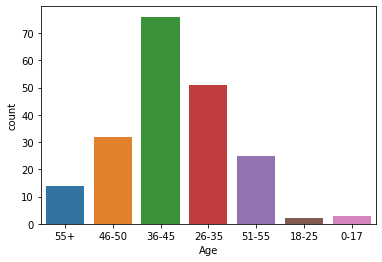

In [19]:
age_product_data("P00285442")

P00285442


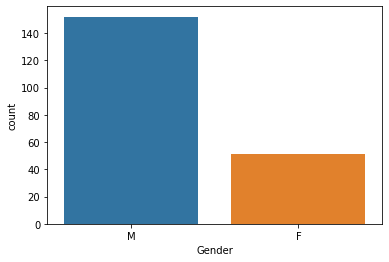

In [20]:
sex_product_data("P00285442")

In [21]:
#for Product_Id in random.sample(keys, 10):
#    sex_product_data(Product_Id)

## #Preprocessing

In [22]:
def preprocess(data):

    data = data.fillna(0)
    age_data = pd.get_dummies(data[['Age', "City_Category"]])
    data = pd.concat([data, age_data], axis = 1)
    data = data.replace({ 'M':0, 'F':1, "4+":4 })
    data['Stay_In_Current_City_Years'] = pd.to_numeric(data['Stay_In_Current_City_Years'])
    data = data.drop(["Age", "City_Category", "User_ID", "Product_ID"], axis = 1)
    return data

In [23]:
train_data = preprocess(train_data)

In [24]:
test_data = preprocess(test_data)

### Model Selection

#### Random_forest

In [25]:
X = train_data.drop(["Purchase"], axis =1)
y = train_data["Purchase"]

In [26]:

X_train,  X_test, y_train, y_test = train_test_split(X, y ,test_size = 0.20, random_state = 15)

In [27]:

reg = RandomForestRegressor()

reg.fit(X_train, y_train)

RandomForestRegressor()

In [28]:
reg.score(X_test, y_test) 

0.6340663007755897

#### Xgboost

In [29]:
my_model = XGBRegressor(learning_rate = 0.1, )
my_model.fit(X_train, y_train, verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [30]:
my_model.score(X_test, y_test)

0.6671340756522602

In [31]:
y_pred = my_model.predict(X_test)

In [32]:
y_pred = pd.Series(y_pred)

In [33]:
test_indexes = y_test.index 

In [34]:
y_test = y_test.reset_index()

In [35]:
result = pd.concat([y_test, y_pred], axis = 1)

In [36]:
result

,index,Purchase,0
0,483664,9780,12442.750977
1,179125,12019,13050.436523
2,148091,9754,7807.328125
3,384965,1427,2269.593506
4,197871,8645,6502.312988
...,...,...,...
110009,164214,5991,7391.448242
110010,443661,12901,10734.333008
110011,512804,19472,14341.709961
110012,424100,9916,8203.480469


In [37]:
result['error'] = result["Purchase"] - result[0]

In [38]:
result

,index,Purchase,0,error
0,483664,9780,12442.750977,-2662.750977
1,179125,12019,13050.436523,-1031.436523
2,148091,9754,7807.328125,1946.671875
3,384965,1427,2269.593506,-842.593506
4,197871,8645,6502.312988,2142.687012
...,...,...,...,...
110009,164214,5991,7391.448242,-1400.448242
110010,443661,12901,10734.333008,2166.666992
110011,512804,19472,14341.709961,5130.290039
110012,424100,9916,8203.480469,1712.519531


In [39]:
(abs(result['error']).sum())/110014

2178.982747650299

In [40]:
result['%error'] = (result['error'])/result['Purchase']*100

In [41]:
result

,index,Purchase,0,error,%error
0,483664,9780,12442.750977,-2662.750977,-27.226492
1,179125,12019,13050.436523,-1031.436523,-8.581717
2,148091,9754,7807.328125,1946.671875,19.957678
3,384965,1427,2269.593506,-842.593506,-59.046494
4,197871,8645,6502.312988,2142.687012,24.785275
...,...,...,...,...,...
110009,164214,5991,7391.448242,-1400.448242,-23.375868
110010,443661,12901,10734.333008,2166.666992,16.794567
110011,512804,19472,14341.709961,5130.290039,26.347012
110012,424100,9916,8203.480469,1712.519531,17.270266


{'whiskers': [<matplotlib.lines.Line2D at 0x1a952e0e490>,
 'caps': [<matplotlib.lines.Line2D at 0x1a952e0eb50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a952e0e130>],
 'medians': [<matplotlib.lines.Line2D at 0x1a952e1b250>],
 'fliers': [],
 'means': []}

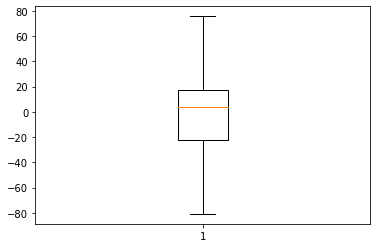

In [42]:
plt.boxplot(result['%error'], showfliers = False)

In [43]:
result["%error"].describe()

count    110014.000000
mean        -16.777168
std          74.816833
min       -4621.385254
25%         -22.063508
50%           4.175578
75%          17.185569
max        2588.136963
Name: %error, dtype: float64

In [44]:
# give value with +- 20% error Xgboost

In [45]:
test_pred = my_model.predict(test_data)

In [49]:
submisssion['Purchase'] = test_pred

<ipython-input-49-7f695a041af5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  submisssion['Purchase'] = test_pred


In [61]:
submisssion.set_index("Purchase", inplace = True)

In [62]:
submisssion.to_csv("submission.csv")